In [ ]:
import pandas as pd
data = pd.read_csv("/content/Train_Data_USA copy.csv")


# Display the first 5 rows in a table format
import IPython.display as display
display.display(data.head(5))

<ipython-input-2-5ba0eee273ce>:2: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("/content/Train_Data_USA copy.csv")


,Incident City,Incident State,Date Of Incident,Incident Time,Quantity Released,Commodity Long Name,Hazardous Class,Total Hazmat Fatalities,Total Damages,Shipper Name,Mode Of Transportation,Cont1 Packaging Type,Cont1 Package Capacity,What Failed,How Failed,Causes of Failure,Incident Result
0,GLEN BURNIE,MD,17/04/2000,1530,0.25000,"CORROSIVE LIQUID, ACIDIC, INORGANIC, N.O.S.",8,0,180,BEVERAGE RESEARCH CENTER INC,Highway,NaN,0.5,NaN,Punctured,NaN,Spillage
1,CHESTER,VA,24/07/2013,1200,30.00000,PAINT RELATED MATERIAL INCLUDING PAINT THINNIN...,3,0,0,CCI,Highway,Drum,55.0,Basic Material,Crushed,Inadequate Blocking and Bracing,Spillage
2,HOUSTON,TX,01/09/2000,NaN,2.00000,"OXIDIZING SOLID, N.O.S.",5.1,0,150,NALCO CHEMICAL CO,Highway,NaN,2400.0,Auxiliary Valve; Piping or Fittings,NaN,Defective Component or Device,Spillage
3,DALLAS,TX,28/07/2021,712,0.09375,"SODIUM HYDROXIDE, SOLUTION",8,0,0,OFFICE DEPOT 1079,Highway,Box,0.0,"Closure (e.g., Cap, Top, or Plug)",Leaked,Improper Preparation for Transportation,Spillage
4,NASHVILLE,TN,20/06/2019,400,0.12500,"FLAMMABLE LIQUIDS, CORROSIVE, N.O.S.",3,0,0,PPG INDUSTRIES INC,Highway,Box,0.0,"Closure (e.g., Cap, Top, or Plug)",Leaked,"Loose Closure, Component, or Device",Spillage


In [ ]:
import pandas as pd

# Assuming 'data' is your DataFrame and it contains columns 'Shipper' and 'Causes of Failure'
# We will assume that 'Causes of Failure' has a column where failure is identified (0 or 1)

# Filter or create a 'Failure' column (if not already present)
# Assuming the 'Causes of Failure' column contains non-zero values for failures, else you may need to adjust this logic
data['Failure'] = data['Causes of Failure'].apply(lambda x: 1 if x != 'Success' else 0)

# Group by Shipper and calculate the number of failures and total shipments
shipper_failure_stats = data.groupby('Shipper Name')['Failure'].agg(['sum', 'count'])

# Calculate failure rate (failures / total shipments)
shipper_failure_stats['failure_rate'] = shipper_failure_stats['sum'] / shipper_failure_stats['count']

# Sort the shipper failure rates in descending order to get the shipper with the highest failure rate
shipper_failure_stats_sorted = shipper_failure_stats.sort_values('failure_rate', ascending=False)

# Display the top shipper(s) with the highest failure rate
print(shipper_failure_stats_sorted.head(100))  # You can adjust this to show the top N shipper(s)

                               sum  count  failure_rate
Shipper Name                                           
   B A S F CORPORATION           1      1           1.0
PPG Industrial                   3      3           1.0
PPG Industries                 135    135           1.0
PPG Industries - Fairburn, GA    1      1           1.0
PPG Industries / PRC Desoto      1      1           1.0
...                            ...    ...           ...
PPG FINISHERS                    1      1           1.0
PPG COATINGS & RESINS GROUP      8      8           1.0
PPG C&R                          1      1           1.0
PPG CANADA INC                   3      3           1.0
PPG CHEMFIL                      1      1           1.0

[100 rows x 3 columns]


In [ ]:
import pandas as pd

# Assuming 'data' is your DataFrame and it contains the columns 'What Failed' and 'How Failed'

# Group by 'What Failed' and 'How Failed' and count the occurrences
failure_combinations = data.groupby(['What Failed', 'How Failed']).size().reset_index(name='count')

# Sort by 'count' in descending order to get the most frequent combinations
failure_combinations_sorted = failure_combinations.sort_values('count', ascending=False)

# Display the top 10 most frequent combinations
print(failure_combinations_sorted.head(10))

                                           What Failed  \
587                  Closure (e.g., Cap, Top, or Plug)   
349                                               Body   
333                                               Body   
105                                     Basic Material   
343                                               Body   
88                                      Basic Material   
330                                               Body   
98                                      Basic Material   
583                  Closure (e.g., Cap, Top, or Plug)   
246  Basic Material; Closure (e.g., Cap, Top, or Plug)   

                            How Failed  count  
587                             Leaked  19559  
349                          Punctured   8188  
333                            Crushed   5129  
105                          Punctured   4759  
343                             Leaked   4336  
88                             Crushed   3874  
330                      

In [ ]:
import pandas as pd

# Assuming 'data' is your DataFrame and it contains the columns 'What Failed' and 'How Failed'

# Group by 'What Failed' and 'How Failed' and count the occurrences
failure_combinations = data.groupby(['What Failed', 'How Failed']).size().reset_index(name='count')

# Pivot the table to show 'What Failed' as rows and 'How Failed' as columns
pivot_table = failure_combinations.pivot(index='What Failed', columns='How Failed', values='count')

# Display the pivoted table
print(pivot_table)

How Failed                                    Abraded  Abraded; Abraded  \
What Failed                                                               
Air Inlet                                         NaN               NaN   
Air Inlet; Air Inlet                              NaN               NaN   
Air Inlet; Basic Material                         NaN               NaN   
Air Inlet; Bottom Outlet Valve                    NaN               NaN   
Air Inlet; Closure (e.g., Cap, Top, or Plug)      NaN               NaN   
...                                               ...               ...   
Washout                                           NaN               NaN   
Washout; Washout                                  NaN               NaN   
Washout; Weld or Seam                             NaN               NaN   
Weld or Seam                                     20.0               NaN   
Weld or Seam; Weld or Seam                        NaN               NaN   

How Failed              

In [ ]:
import pandas as pd

# Assuming 'data' is your DataFrame and contains the columns 'What Failed' and 'How Failed'

# Fill missing values with the mode (most frequent value) for both columns
data['What Failed'] = data['What Failed'].fillna(data['What Failed'].mode()[0])
data['How Failed'] = data['How Failed'].fillna(data['How Failed'].mode()[0])

# Get the top 10 most frequent occurrences of 'What Failed'
top_what_failed = data['What Failed'].value_counts().head(10).reset_index(name='What Failed Count')
top_what_failed.columns = ['What Failed', 'Count']

# Get the top 10 most frequent occurrences of 'How Failed'
top_how_failed = data['How Failed'].value_counts().head(10).reset_index(name='How Failed Count')
top_how_failed.columns = ['How Failed', 'Count']

# Merge the two tables side by side
top_failures_table = pd.merge(top_what_failed, top_how_failed, left_index=True, right_index=True, how='outer')

# Display the table with top 10 most frequent "What Failed" and "How Failed" together
print(top_failures_table)

                                         What Failed  Count_x  \
0                  Closure (e.g., Cap, Top, or Plug)    43358   
1                                               Body    22267   
2                                     Basic Material    14483   
3  Basic Material; Closure (e.g., Cap, Top, or Plug)     4236   
4                                    Inner Packaging     1712   
5                                   Inner Receptacle     1456   
6                                       Weld or Seam     1301   
7                                              Cover     1124   
8                Auxiliary Valve; Piping or Fittings      500   
9                     Basic Material; Basic Material      493   

                          How Failed  Count_y  
0                             Leaked    54943  
1                          Punctured    14722  
2                            Crushed    10583  
3                            Cracked     5698  
4                  Burst or Ruptured     321

In [ ]:
# Fill missing values with the mode (most frequent value) for each column
data['Causes of Failure'] = data['Causes of Failure'].fillna(data['Causes of Failure'].mode()[0])
data['What Failed'] = data['What Failed'].fillna(data['What Failed'].mode()[0])
data['How Failed'] = data['How Failed'].fillna(data['How Failed'].mode()[0])

# Get the top 10 most frequent combinations of 'Causes of Failure', 'What Failed', and 'How Failed'
top_failure_combinations = data.groupby(['Causes of Failure', 'What Failed', 'How Failed']).size().reset_index(name='Count')

# Sort by 'Count' in descending order and get the top 10
top_failure_combinations_sorted = top_failure_combinations.sort_values(by='Count', ascending=False).head(20)

# Display the top 10 combinations
print(top_failure_combinations_sorted)

                                      Causes of Failure  \
4184                Loose Closure, Component, or Device   
1943                                  Forklift Accident   
2214                                        Human Error   
2828            Improper Preparation for Transportation   
5749  Water Damage; Loose Closure, Component, or Device   
1427                                            Dropped   
2619  Impact with Sharp or Protruding Object (e.g., ...   
704                       Defective Component or Device   
2864            Improper Preparation for Transportation   
3360                    Inadequate Blocking and Bracing   
4050                Loose Closure, Component, or Device   
3656          Inadequate Preparation for Transportation   
1669                                   Dropped; Dropped   
1929                                  Forklift Accident   
1383                                            Dropped   
2788            Improper Preparation for Transportation 

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         2
           8       0.00      0.00      0.00        12
          10       0.50      0.33      0.40         3
          12       0.00      0.00      0.00         1
          14       0.00      0.00      0.00         0
          15       0.19      0.26      0.22        19
          16       0.00      0.00      0.00         1
          17       0.58      0.52      0.55       583
          18       0.43      0.12      0.18        26
          19       0.00      0.00      0.00         1
          24       0.96      0.95      0.95       146
          25       0.00      0.00      0.00         1
          27       0.00      0.00      0.00 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_

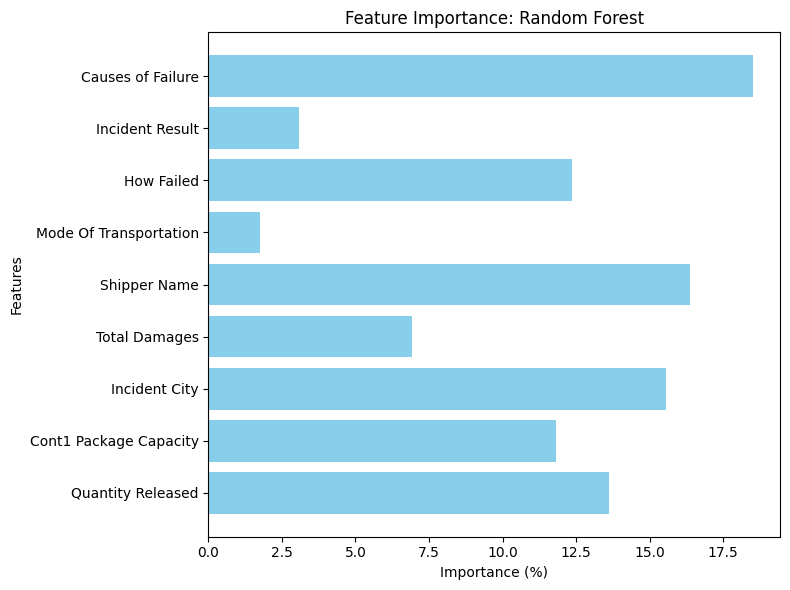

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Sample 1,000 observations randomly (adjust as needed)
data = data.sample(n=20000, random_state=42)

# Select relevant features and target variable
features = ['Quantity Released',
            'Cont1 Package Capacity', 'Incident City', 'Total Damages',
            'Shipper Name',
            'Mode Of Transportation', 'How Failed', 'Incident Result', 'Causes of Failure']
target = 'What Failed'

# Handle missing values
num_features = data[features].select_dtypes(include=['float64', 'int64']).columns
cat_features = data[features].select_dtypes(include=['object']).columns

# Impute missing values
num_imputer = SimpleImputer(strategy='median')
cat_imputer = SimpleImputer(strategy='most_frequent')

data[num_features] = num_imputer.fit_transform(data[num_features])
data[cat_features] = cat_imputer.fit_transform(data[cat_features])

# Encode categorical variables
label_encoders = {}
for col in cat_features:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardize the numerical data
scaler = StandardScaler()
data[num_features] = scaler.fit_transform(data[num_features])

# Split the data into training and testing sets
X = data[features]
y = data[target]
y = LabelEncoder().fit_transform(y)  # Encode target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Random Forest Model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)  # Random Forest with 100 trees
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)

# Evaluation: Random Forest
print("Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))
print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf))

# Feature Importance: Random Forest
rf_importance = rf_model.feature_importances_  # Extract feature importance
rf_importance_percent = 100 * (rf_importance / rf_importance.sum())  # Convert to percentage

# Plot Feature Importance
plt.figure(figsize=(8, 6))
plt.barh(features, rf_importance_percent, color='skyblue')
plt.title('Feature Importance: Random Forest')
plt.xlabel('Importance (%)')
plt.ylabel('Features')
plt.tight_layout()
plt.show()

In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 15.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=7e68f25b73f9eba118b76c1c7d2285f542b5965bdc6df6dd8dc42b23b4dc89d7
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
pip install lime

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Best parameters: {'max_depth': 15, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2}
Classification Report:
                                                    precision    recall  f1-score   support

                                           Abraded       1.00      0.25      0.40         4
                                Abraded; Punctured       0.00      0.00      0.00         1
                                              Bent       0.00      0.00      0.00        11
                                      Bent; Leaked       0.00      0.00      0.00         2
                                 Burst or Ruptured       0.21      0.06      0.09        71
              Burst or Ruptured; Burst or Ruptured       1.00      0.50      0.67         2
                        Burst or Ruptured; Crushed       0.00      0.00      0.00         1
                  Burst or Ruptured; Gouged or Cut       0.00      0.00      0.00         1
                 Burst or Ruptured; Ripped o

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_

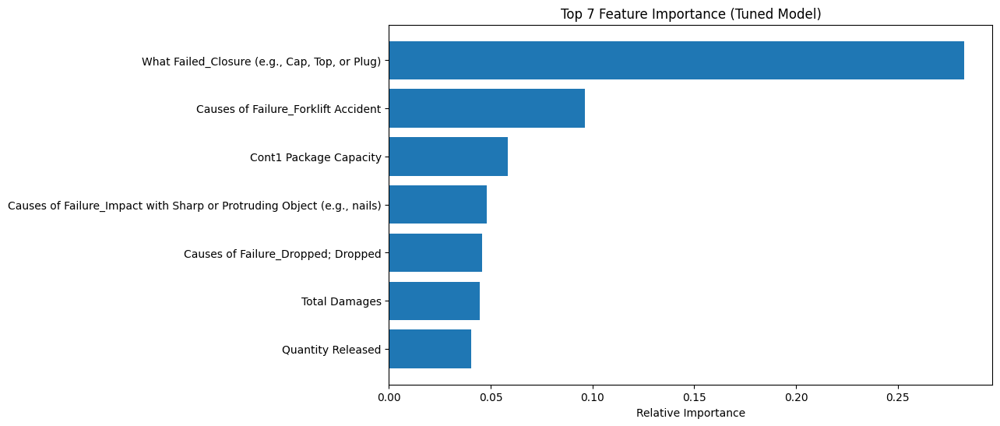

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


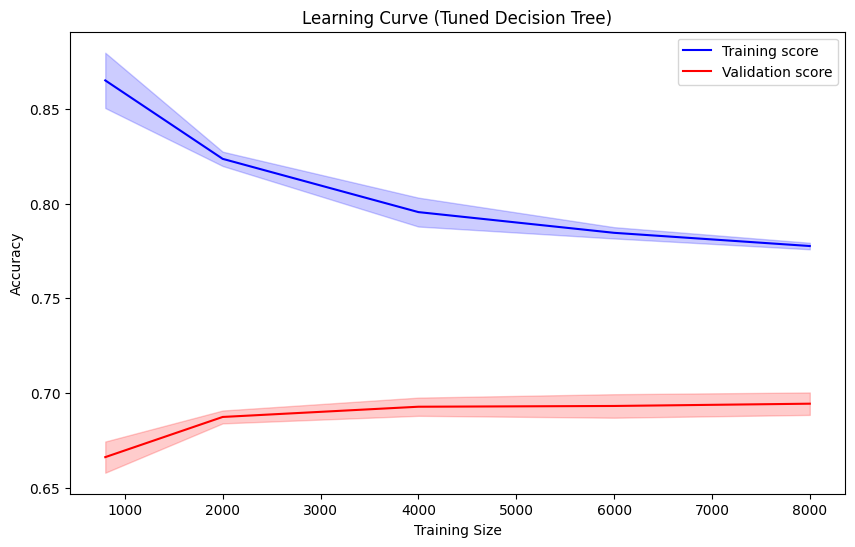

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [ ]:
from sklearn.model_selection import GridSearchCV, cross_val_score, learning_curve
from sklearn.tree import DecisionTreeClassifier
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, accuracy_score
from lime.lime_tabular import LimeTabularExplainer

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'max_depth': [5, 10, 15, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2'],
}

# Create a DecisionTree model
model = DecisionTreeClassifier(random_state=42)

# Grid search with 5-fold cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best parameters found by grid search
print(f"Best parameters: {grid_search.best_params_}")

# Best model after tuning
best_model = grid_search.best_estimator_

# Evaluate the tuned model
y_pred = best_model.predict(X_test)

# Classification report and accuracy score
print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Accuracy Score after Tuning:")
print(accuracy_score(y_test, y_pred))

# --- Feature Importance Plot for the best model ---
importances = best_model.feature_importances_
indices = importances.argsort()

# Get the top 7 features based on importance
top_features = indices[-7:]

# Plotting the top 7 feature importances
plt.figure(figsize=(10, 6))
plt.title("Top 7 Feature Importance (Tuned Model)")
plt.barh(range(7), importances[top_features], align="center")
plt.yticks(range(7), [X.columns[i] for i in top_features])
plt.xlabel("Relative Importance")
plt.show()

# --- Learning Curve Plot for the best model ---
train_sizes, train_scores, val_scores = learning_curve(best_model, X, y, cv=5, train_sizes=[0.1, 0.25, 0.5, 0.75, 1.0], scoring="accuracy")

# Calculating the mean and standard deviation for plotting
train_mean = train_scores.mean(axis=1)
val_mean = val_scores.mean(axis=1)
train_std = train_scores.std(axis=1)
val_std = val_scores.std(axis=1)

# Plotting the learning curve
plt.figure(figsize=(10, 6))
plt.title("Learning Curve (Tuned Decision Tree)")
plt.plot(train_sizes, train_mean, label="Training score", color="blue")
plt.plot(train_sizes, val_mean, label="Validation score", color="red")
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color="blue", alpha=0.2)
plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, color="red", alpha=0.2)
plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.legend(loc="best")
plt.show()

# --- LIME for Explaining Predictions ---

# Initialize the LIME explainer
explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X.columns,
    class_names=[str(i) for i in np.unique(y_train)],
    mode='classification'
)

# Choose an instance from the test set to explain
instance = X_test.iloc[0].values.reshape(1, -1)  # Example: explaining the first test instance

# Explain the prediction for the chosen instance
explanation = explainer.explain_instance(instance[0], best_model.predict_proba, num_features=5)

# Display the explanation
explanation.show_in_notebook(show_table=True, show_all=False)

In [ ]:
from lime.lime_tabular import LimeTabularExplainer

# Initialize the LIME explainer
explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X.columns,
    class_names=[str(i) for i in np.unique(y_train)],
    mode='classification'
)

# Choose multiple instances from the test set to explain
instances = X_test.iloc[:5].values  # Selecting the first 5 instances from the test set

# Explain the predictions for the selected instances
explanations = []
for instance in instances:
    explanation = explainer.explain_instance(instance, best_model.predict_proba, num_features=5)
    explanations.append(explanation)

# Display the explanations for each instance
for i, explanation in enumerate(explanations):
    print(f"Explanation for Instance {i + 1}:")
    explanation.show_in_notebook(show_table=True, show_all=False)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


Explanation for Instance 1:


Explanation for Instance 2:


Explanation for Instance 3:


Explanation for Instance 4:


Explanation for Instance 5:
